# This is a notebook to visualize plays

## Imports

In [1]:
import pandas as pd
import numpy as np
import pandasql as ps
import plotly.express as px
import random
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Read In csvs
games = pd.read_csv("games.csv")
plays = pd.read_csv("plays.csv")
players = pd.read_csv("players.csv").drop("displayName",axis=1)
week1 = pd.read_csv("tracking_week_1.csv")
tackles = pd.read_csv("tackles.csv")


In [2]:
plays

,gameId,playId,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,...,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2
0,2022100908,3537,48723,Parker Hesse,(7:52) (Shotgun) M.Mariota pass short middle t...,4,1,10,ATL,TB,...,0.976785,0.023215,-0.006110,0.006110,2.360609,0.981955,NaN,NaN,NaN,NaN
1,2022091103,3126,52457,Chase Claypool,(7:38) (Shotgun) C.Claypool right end to PIT 3...,4,1,10,PIT,CIN,...,0.160485,0.839515,-0.010865,0.010865,1.733344,-0.263424,NaN,NaN,NaN,NaN
2,2022091111,1148,42547,Darren Waller,(8:57) D.Carr pass short middle to D.Waller to...,2,2,5,LV,LAC,...,0.756661,0.243339,-0.037409,0.037409,1.312855,1.133666,NaN,NaN,NaN,NaN
3,2022100212,2007,46461,Mike Boone,(13:12) M.Boone left tackle to DEN 44 for 7 ya...,3,2,10,DEN,LV,...,0.620552,0.379448,-0.002451,0.002451,1.641006,-0.043580,NaN,NaN,NaN,NaN
4,2022091900,1372,47857,Devin Singletary,(8:33) D.Singletary right guard to TEN 32 for ...,2,1,10,BUF,TEN,...,0.836290,0.163710,0.001053,-0.001053,3.686428,-0.167903,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12481,2022100204,123,43293,Ezekiel Elliott,(13:31) E.Elliott right tackle to WAS 38 for 1...,1,1,10,DAL,WAS,...,0.638600,0.361400,-0.011542,0.011542,3.642571,-0.504018,NaN,NaN,NaN,NaN
12482,2022091200,3467,46189,Will Dissly,(6:08) G.Smith pass short right to W.Dissly to...,4,1,10,SEA,DEN,...,0.615241,0.384759,-0.025458,0.025458,1.434580,-0.444642,NaN,NaN,NaN,NaN
12483,2022101605,3371,44860,Joe Mixon,(9:35) (Shotgun) J.Mixon left end to CIN 47 fo...,4,1,10,CIN,NO,...,0.667054,0.332946,-0.005164,0.005164,2.115356,0.203819,NaN,NaN,NaN,NaN
12484,2022100207,2777,52449,Jonathan Taylor,(2:02) (Shotgun) J.Taylor up the middle to TEN...,3,1,10,IND,TEN,...,0.410611,0.589389,-0.046648,0.046648,3.946232,-0.976039,NaN,NaN,NaN,NaN


## Dataset

In [3]:
week1 = ps.sqldf('''
select 
    a.*,
    b.x as ball_x, 
    b.y as ball_y
from 
    week1 as a
inner join 
    (select
        gameId,
        playId,
        frameId,
        x,
        y
    from 
        week1
    where
        club like 'football'
        )
    as b
on a.gameId=b.gameId
and a.playId=b.playId
and a.frameId=b.frameId
         ''')

week1 = ps.sqldf('''
select 
    a.*,
    b.possessionTeam,
    b.playDescription,
    b.down,
    b.yardsToGo,
    case when b.yardsToGo<=b.playResult then 1 else 0 end as first_down_or_td

from 
    week1 as a
inner join 
    plays as b
on a.gameId=b.gameId
and a.playId=b.playId
         ''')
week1["distance_to_ball"]= ((week1.x-week1.ball_x)**2 + (week1.y-week1.ball_y)**2)**.5
week1["Offense"] = np.where(week1['possessionTeam']== week1['club'], 1, 0)
week1["ahead"] = np.where(((week1['playDirection']== 'left') & (week1.x<week1.ball_x)) | ((week1['playDirection']== 'right') & (week1.x>week1.ball_x)), 1, 0)


In [4]:
joined_all = pd.merge(games,plays,how="inner",on = "gameId")
joined_all = pd.merge(joined_all,week1,how="inner",on=["gameId","playId"])
joined_all = pd.merge(joined_all,tackles,how="left",on=["gameId","playId","nflId"])
# left join on players to keep football records
joined_all = pd.merge(joined_all,players,how="left",on = "nflId")


## Vizualize plays

In [5]:
colors = {
    'ARI':"#97233F", 
    'ATL':"#A71930", 
    'BAL':'#241773', 
    'BUF':"#00338D", 
    'CAR':"#0085CA", 
    'CHI':"#C83803", 
    'CIN':"#FB4F14", 
    'CLE':"#311D00", 
    'DAL':'#003594',
    'DEN':"#FB4F14", 
    'DET':"#0076B6", 
    'GB':"#203731", 
    'HOU':"#03202F", 
    'IND':"#002C5F", 
    'JAX':"#9F792C", 
    'KC':"#E31837", 
    'LA':"#003594", 
    'LAC':"#0080C6", 
    'LV':"#000000",
    'MIA':"#008E97", 
    'MIN':"#4F2683", 
    'NE':"#002244", 
    'NO':"#D3BC8D", 
    'NYG':"#0B2265", 
    'NYJ':"#125740", 
    'PHI':"#004C54", 
    'PIT':"#FFB612", 
    'SEA':"#69BE28", 
    'SF':"#AA0000",
    'TB':'#D50A0A', 
    'TEN':"#4B92DB", 
    'WAS':"#5A1414", 
    'football':'#ffffff'
}

In [6]:

def run_play():
    game_focus = random.choice(joined_all.gameId.unique())
    game= joined_all[(joined_all.gameId==game_focus)]
    play_focus = random.choice(game.playId.unique())

    focused_df = game[(game.playId==play_focus)]
    frame=[]
    df_offense_ahead = []
    df_defense_ahead = []
    df_offense_within_5 = []
    df_defense_within_5 = []

    fig = go.Figure( layout_yaxis_range=[0,53.3], layout_xaxis_range=[0,120],)
    fig1=make_subplots(rows=2,cols=2,subplot_titles=("Number of Offensive Players Between the Ball and Endzone","Number of Defensive Players Between the Ball and Endzone",
                                                     "Number of Offensive Players Offense within 5 yards of the ball","Number of Defensive Players within 5 yards of the ball"))
    for i in focused_df.frameId.unique():
        for team in focused_df.club.unique():
            plot_df = focused_df[(focused_df.club==team)&(focused_df.frameId==i)]
            fig.add_trace(go.Scatter(x=plot_df["x"], y=plot_df["y"],mode = 'markers',marker_color=colors[team],name=team))
        df_offense_ahead.append(sum(np.where((focused_df['frameId']== i) & (focused_df['Offense']== 1) & (focused_df['ahead']== 1),1, 0)))
        df_defense_ahead.append(sum(np.where((focused_df['frameId']== i) & (focused_df['Offense']== 0) & (focused_df['ahead']== 1),1, 0)))
        df_offense_within_5.append(sum(np.where((focused_df['frameId']== i) & (focused_df['Offense']== 1) & (focused_df['distance_to_ball']<=5),1, 0)))
        df_defense_within_5.append(sum(np.where((focused_df['frameId']== i) & (focused_df['Offense']== 0) & (focused_df['distance_to_ball']<=5),1, 0)))
        frame.append(i)
    fig1.add_trace(go.Scatter(x=frame, y=df_offense_ahead),row=1, col=1)
    fig1.add_trace(go.Scatter(x=frame, y=df_defense_ahead),row=1, col=2)
    fig1.add_trace(go.Scatter(x=frame, y=df_offense_within_5),row=2, col=1)
    fig1.add_trace(go.Scatter(x=frame, y=df_defense_within_5),row=2, col=2)
    fig.update_layout(title_text=focused_df['playDescription_x'].unique()[0])
    fig.show()
    fig1.show()

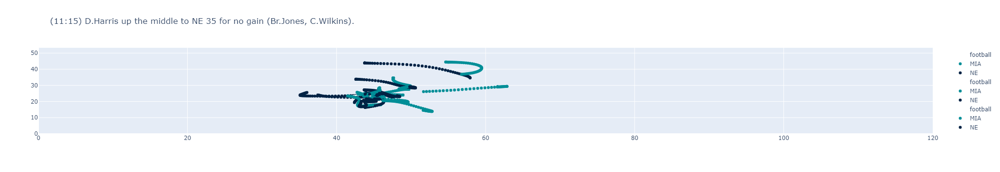

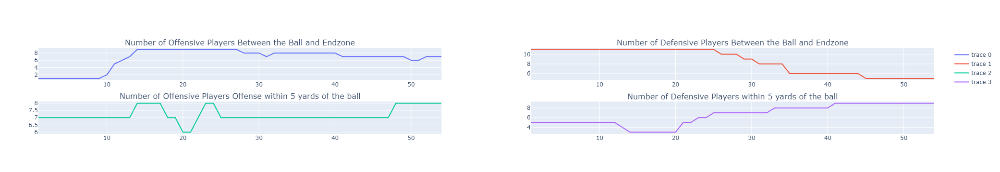

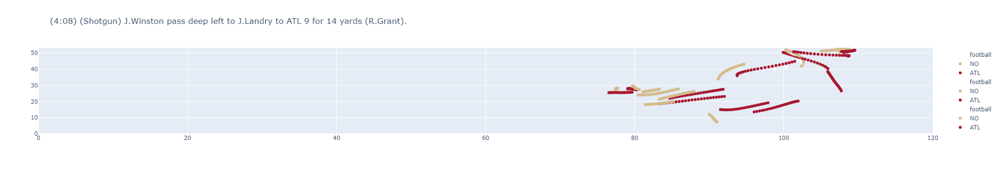

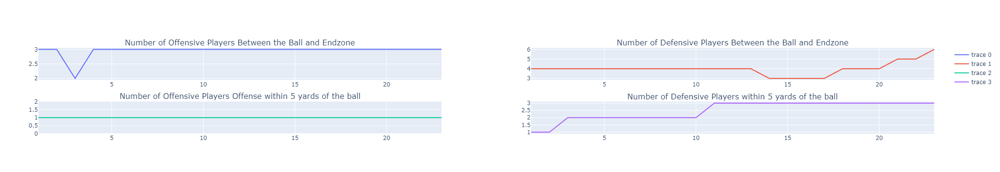

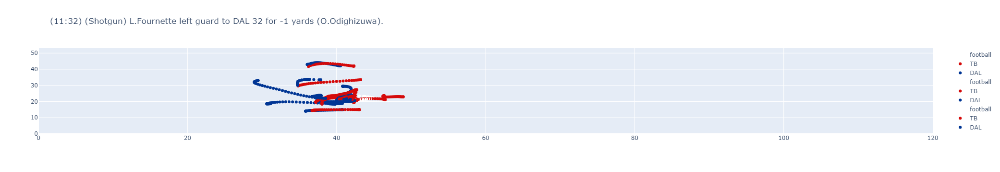

...

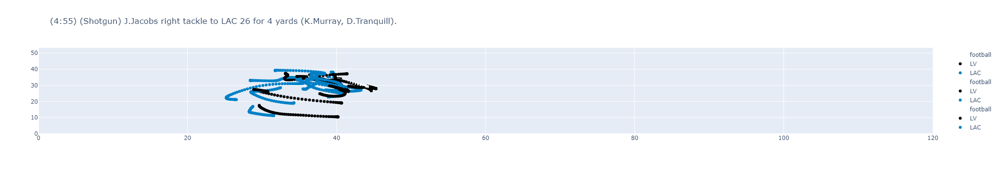

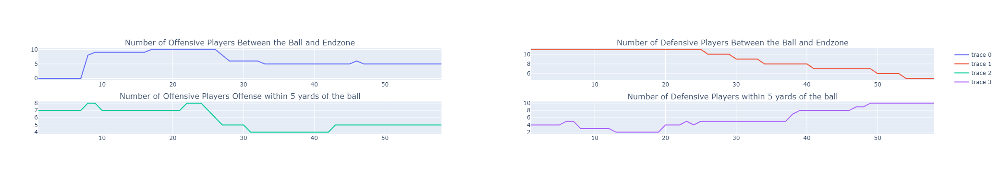

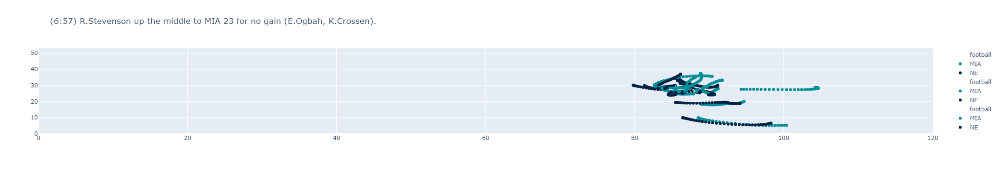

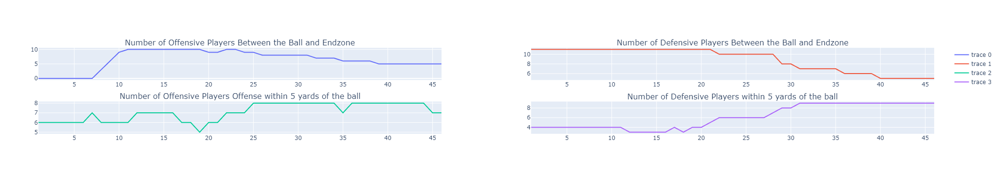

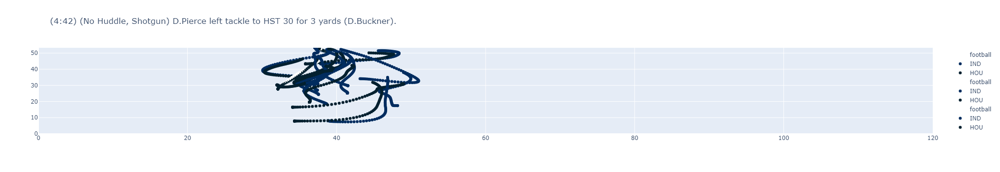

In [7]:
for i in range((50)):
    run_play()

In [8]:
week1_test = ps.sqldf('''
select 
    *,
    case when event in ('out_of_bounds','tackle') then 0
    else 1 end as touchdown
from
    week1
where
    event in ('out_of_bounds','tackle','touchdown')
         ''')

In [9]:
week1_test[(week1_test.playId==364)& (week1_test.club=='BUF')]

,gameId,playId,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,...,ball_y,possessionTeam,playDescription,down,yardsToGo,first_down_or_td,distance_to_ball,Offense,ahead,touchdown
255,2022090800,364,37075.0,Von Miller,8,2022-09-08 20:35:18.099999,40.0,BUF,right,28.40,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,42.062644,0,0,0
256,2022090800,364,40107.0,Micah Hyde,8,2022-09-08 20:35:18.099999,23.0,BUF,right,51.60,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,20.440714,0,0,0
257,2022090800,364,40166.0,Jordan Poyer,8,2022-09-08 20:35:18.099999,21.0,BUF,right,53.87,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,2.832419,0,1,0
259,2022090800,364,41341.0,DaQuan Jones,8,2022-09-08 20:35:18.099999,92.0,BUF,right,29.38,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,35.354668,0,0,0
263,2022090800,364,44976.0,Matt Milano,8,2022-09-08 20:35:18.099999,58.0,BUF,right,36.88,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,49.439049,0,0,0
264,2022090800,364,46085.0,Tremaine Edmunds,8,2022-09-08 20:35:18.099999,49.0,BUF,right,45.45,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,17.245805,0,0,0
267,2022090800,364,46190.0,Taron Johnson,8,2022-09-08 20:35:18.099999,7.0,BUF,right,43.94,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,12.240478,0,0,0
269,2022090800,364,47792.0,Ed Oliver,8,2022-09-08 20:35:18.099999,91.0,BUF,right,28.69,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,29.918506,0,0,0
272,2022090800,364,52647.0,Dane Jackson,8,2022-09-08 20:35:18.099999,30.0,BUF,right,45.48,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,47.633116,0,0,0
273,2022090800,364,53459.0,Gregory Rousseau,8,2022-09-08 20:35:18.099999,50.0,BUF,right,29.12,...,-0.42,LA,(8:25) (Shotgun) M.Stafford pass deep right to...,3,8,1,31.011006,0,0,0


In [10]:
pd.set_option('display.max_colwidth', None)


In [11]:
(week1_test[week1_test["first_down_or_td"]==1])[["yardsToGo","playDescription"]]

,yardsToGo,playDescription
23,4,"(14:29) (No Huddle, Shotgun) J.Allen scrambles right end to BUF 38 for 7 yards (E.Jones)."
24,4,"(14:29) (No Huddle, Shotgun) J.Allen scrambles right end to BUF 38 for 7 yards (E.Jones)."
25,4,"(14:29) (No Huddle, Shotgun) J.Allen scrambles right end to BUF 38 for 7 yards (E.Jones)."
26,4,"(14:29) (No Huddle, Shotgun) J.Allen scrambles right end to BUF 38 for 7 yards (E.Jones)."
27,4,"(14:29) (No Huddle, Shotgun) J.Allen scrambles right end to BUF 38 for 7 yards (E.Jones)."
...,...,...
32926,2,"(2:00) (Shotgun) R.Wilson pass short right to J.Williams to DEN 49 for 9 yards (J.Brooks, U.Nwosu)."
32927,2,"(2:00) (Shotgun) R.Wilson pass short right to J.Williams to DEN 49 for 9 yards (J.Brooks, U.Nwosu)."
32928,2,"(2:00) (Shotgun) R.Wilson pass short right to J.Williams to DEN 49 for 9 yards (J.Brooks, U.Nwosu)."
32929,2,"(2:00) (Shotgun) R.Wilson pass short right to J.Williams to DEN 49 for 9 yards (J.Brooks, U.Nwosu)."


In [12]:
week1_test2 = ps.sqldf('''
select 
   sum(Offense=1 and ahead=1) as offense_ahead,
   sum(Offense=0 and ahead=1) as defense_ahead,
   sum(Offense=1 and distance_to_ball > 0 and distance_to_ball <=5) as offense_within_5,
   sum(Offense=0 and distance_to_ball > 0 and distance_to_ball <=5) as defense_within_5,
   max(first_down_or_td) as first_down_or_td
from 
week1_test
where
yardsToGo >=4
and
yardsToGo <= 6
group by gameId,playId,time
         ''')

In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

In [15]:
week1_test2[['offense_ahead','defense_ahead','offense_within_5','defense_within_5']]

,offense_ahead,defense_ahead,offense_within_5,defense_within_5
0,5,7,1,4
1,3,3,1,3
2,4,5,2,3
3,5,7,3,4
4,2,4,1,3
...,...,...,...,...
191,0,0,1,2
192,6,5,5,6
193,3,7,1,4
194,3,4,1,4


In [16]:
model = LogisticRegression(solver='liblinear', random_state=0)

In [17]:
model.fit(week1_test2[['offense_ahead','defense_ahead','offense_within_5','defense_within_5']],week1_test2['first_down_or_td'])


LogisticRegression(random_state=0, solver='liblinear')

In [18]:
model.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 0,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [19]:
predicted_results=[]
for i in range(len(week1_test2['first_down_or_td'])):        
    predicted_results.append(np.append(model.predict_proba(week1_test2[['offense_ahead','defense_ahead','offense_within_5','defense_within_5']])[i],week1_test2['first_down_or_td'][i]))

In [20]:
df= pd.DataFrame(predicted_results,columns=["No 1st %","1st %","Actual"])

In [21]:
len(df[(df["1st %"]>=0) & (df["Actual"]==1)])+len(df[(df["No 1st %"]>=.5) & (df["Actual"]==0)])

174

In [22]:
no_first_correct = []
first_correct = []
total_correct=[]
stop=0
stop_amount=[]
while stop<1:
    no_first_correct.append(np.sum((stop > df["1st %"]) & (df["Actual"] == 0)))
    first_correct.append(np.sum((stop <= df["1st %"]) & (df["Actual"] == 1)))
    total_correct.append(np.sum((stop > df["1st %"]) & (df["Actual"] == 0))+np.sum((stop <= df["1st %"]) & (df["Actual"] == 1)))
    stop_amount.append(stop)

    stop=stop+.0001


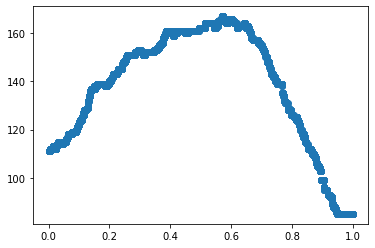

In [23]:
import matplotlib.pyplot as plt
plt.scatter(stop_amount,total_correct)

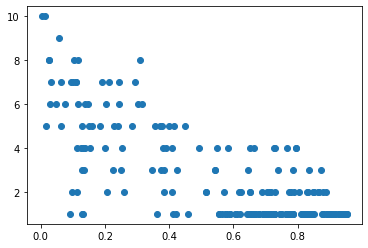

In [34]:
plt.scatter(df["1st %"],week1_test2['offense_within_5'])

In [25]:
from scipy import stats
stats.spearmanr(week1_test2['offense_ahead'], week1_test2['first_down_or_td'])

SpearmanrResult(correlation=-0.602833737493613, pvalue=8.871208310409345e-21)

In [26]:
stats.spearmanr(week1_test2['defense_within_5'], week1_test2['first_down_or_td'])

SpearmanrResult(correlation=-0.37597814214580416, pvalue=5.616424057341083e-08)

In [27]:
stats.spearmanr(week1_test2['defense_ahead'], week1_test2['first_down_or_td'])

SpearmanrResult(correlation=-0.6011367691916902, pvalue=1.2138360260259401e-20)

In [28]:
stats.spearmanr(week1_test2['offense_within_5'], week1_test2['first_down_or_td'])

SpearmanrResult(correlation=-0.4854103795490077, pvalue=5.562630939009262e-13)

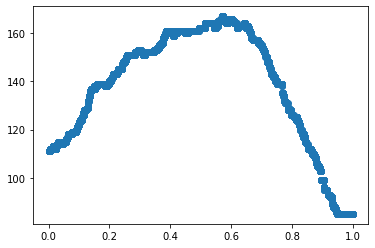

In [29]:
import matplotlib.pyplot as plt
plt.scatter(stop_amount,total_correct)

In [30]:
plays.playResult.unique()

array([  9,   3,  15,   7,   5,  11,   6,   0,  10,   8,   2,  -1,  -4,
         1,  -3,  48,  31,  -2,  23,  18,  22,  26,  21,  41,  17,  24,
        19,   4,  25,  29,  12, -10,  14, -19,  -7,  20,  13,  -5,  32,
        16,  34,  50,  30,  -6,  45,  52,  -8,  38,  39,  44,  64,  63,
       -15, -59,  28,  54,  51,  53,  27,  35,  65,  75,  42,  33,  60,
       -45, -20, -13, -39,  57,  36,  37,  62,  -9,  79,  81,  68,  67,
        58,  46,  40,  43,  49,  47,  55,  69,  56,  61, -26, -14,  98,
        59,  74, -21, -61,  66,  71], dtype=int64)

In [31]:
plays["yardsToGo"]>plays["playResult"]

0         True
1         True
2        False
3         True
4         True
         ...  
12481     True
12482     True
12483     True
12484     True
12485    False
Length: 12486, dtype: bool